---
#  Employee Attrition in Organizations: Understanding Why Workers Quit

---

## Introduction
Employees play a critical role in an organization’s success. The quality of the workforce significantly impacts overall performance. However, organizations often face challenges related to employee attrition. Let’s explore some of these challenges:

1. Costly Training: Hiring and training new employees can be expensive in terms of both time and money.
2. Loss of Experience: When experienced employees leave, the organization loses valuable knowledge and expertise.
3. Productivity Impact: High attrition rates can negatively affect productivity.
4. Financial Implications: Attrition can impact the company’s profitability.

Before getting our hands dirty with the data, first step is to frame the business question. Having clarity on below questions is very crucial because the solution that is being developed will make sense only if we have well stated problem.

------
Framing Business Questions
Before diving into data analysis, it’s essential to define clear business questions. Having well-stated problems ensures that the solutions developed are meaningful. Let’s consider the following questions:
------
1. Factors Contributing to Attrition: What specific factors contribute to employee attrition?
2. Retention Strategies: What measures can the company implement to retain employees?
3. Business Value of Solutions: How will the proposed model benefit the organization?
4. Cost Savings: Can the model lead to significant cost savings?
5. Identifying Problem Areas: Which business units face the most significant attrition challenges?

<a id="Read Data"></a>
# <center> <p style="background-color:darkorange; font-family:calibri; font-size:120%; color:black; text-align:center; border-radius: 50px; padding:10px;width:50%">Importing Required Modules</p> </center>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import hvplot
import hvplot.pandas
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

<a id="Read Data"></a>
# <center> <p style="background-color:darkorange; font-family:calibri; font-size:120%; color:black; text-align:center; border-radius: 50px; padding:10px;width:50%">Read Data</p> </center>

In [2]:
df = pd.read_csv("HR-Employee-Attrition.csv")
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


<a id="Read Data"></a>
# <center> <p style="background-color:darkorange; font-family:calibri; font-size:120%; color:black; text-align:center; border-radius: 50px; padding:10px;width:50%">Exploratory Data Analysis</p> </center>

---
#  Exploratory Data Analysis

- Find patterns in data through data visualization. Reveal hidden secrets of the data through graphs, analysis and charts.
    - Univariate analysis
        > - Continous variables : Histograms, boxplots. This gives us understanding about the central tendency and spread
        > - Categorical variable : Bar chart showing frequency in each category
    - Bivariate analysis
        > - Continous & Continous : Scatter plots to know how continous variables interact with each other
        > - Categorical & categorical : Stacked column chart to show how the frequencies are spread between two
        > - categorical variables
        > - Categorical & Continous : Boxplots, Swamplots or even bar charts
- Detect outliers
- Feature engineering

In [3]:
df.shape

(1470, 35)

In [4]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


In [7]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [8]:
for column in df.columns:
    print(f"{column}: Number of unique values {df[column].nunique()}")

Age: Number of unique values 43
Attrition: Number of unique values 2
BusinessTravel: Number of unique values 3
DailyRate: Number of unique values 886
Department: Number of unique values 3
DistanceFromHome: Number of unique values 29
Education: Number of unique values 5
EducationField: Number of unique values 6
EmployeeCount: Number of unique values 1
EmployeeNumber: Number of unique values 1470
EnvironmentSatisfaction: Number of unique values 4
Gender: Number of unique values 2
HourlyRate: Number of unique values 71
JobInvolvement: Number of unique values 4
JobLevel: Number of unique values 5
JobRole: Number of unique values 9
JobSatisfaction: Number of unique values 4
MaritalStatus: Number of unique values 3
MonthlyIncome: Number of unique values 1349
MonthlyRate: Number of unique values 1427
NumCompaniesWorked: Number of unique values 10
Over18: Number of unique values 1
OverTime: Number of unique values 2
PercentSalaryHike: Number of unique values 15
PerformanceRating: Number of uni

In [9]:
# calculate duplicates
dups = df.duplicated()
# report if there are any duplicates
print(dups.any())
# list all duplicate rows
print(df[dups])

False
Empty DataFrame
Columns: [Age, Attrition, BusinessTravel, DailyRate, Department, DistanceFromHome, Education, EducationField, EmployeeCount, EmployeeNumber, EnvironmentSatisfaction, Gender, HourlyRate, JobInvolvement, JobLevel, JobRole, JobSatisfaction, MaritalStatus, MonthlyIncome, MonthlyRate, NumCompaniesWorked, Over18, OverTime, PercentSalaryHike, PerformanceRating, RelationshipSatisfaction, StandardHours, StockOptionLevel, TotalWorkingYears, TrainingTimesLastYear, WorkLifeBalance, YearsAtCompany, YearsInCurrentRole, YearsSinceLastPromotion, YearsWithCurrManager]
Index: []

[0 rows x 35 columns]


We observe that **'EmployeeCount'**, **'Over18'**, and **'StandardHours'** each have only one unique value, while **'EmployeeNumber'** has 1470 unique values. These features hold no utility for our analysis, thus we intend to remove these columns."

In [10]:
df.drop(['EmployeeCount', 'EmployeeNumber', 'Over18', 'StandardHours'], axis=1, inplace=True)

In [11]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2


---
## 📉 Categorical Features

In [12]:
categorical_col = []
for column in df.columns:
    if df[column].dtype == object and len(df[column].unique()) <= 30:
        categorical_col.append(column)
        print(f"{column} : {df[column].unique()}")
        print(df[column].value_counts())
        print("====================================")

Attrition : ['Yes' 'No']
Attrition
No     1233
Yes     237
Name: count, dtype: int64
BusinessTravel : ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
BusinessTravel
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: count, dtype: int64
Department : ['Sales' 'Research & Development' 'Human Resources']
Department
Research & Development    961
Sales                     446
Human Resources            63
Name: count, dtype: int64
EducationField : ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
EducationField
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: count, dtype: int64
Gender : ['Female' 'Male']
Gender
Male      882
Female    588
Name: count, dtype: int64
JobRole : ['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representativ

In [13]:
print(len(categorical_col))
print(categorical_col)

8
['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']


### So there are 8 column with categorical values apart from attrition column

---
## 📉 Numerical Features
---

In [14]:
numerical_col = []
for column in df.columns:
    if df[column].dtypes != object and df[column].nunique() < 30:
        print(f"{column} : {df[column].unique()}")
        numerical_col.append(column)
        print("====================================")

DistanceFromHome : [ 1  8  2  3 24 23 27 16 15 26 19 21  5 11  9  7  6 10  4 25 12 18 29 22
 14 20 28 17 13]
Education : [2 1 4 3 5]
EnvironmentSatisfaction : [2 3 4 1]
JobInvolvement : [3 2 4 1]
JobLevel : [2 1 3 4 5]
JobSatisfaction : [4 2 3 1]
NumCompaniesWorked : [8 1 6 9 0 4 5 2 7 3]
PercentSalaryHike : [11 23 15 12 13 20 22 21 17 14 16 18 19 24 25]
PerformanceRating : [3 4]
RelationshipSatisfaction : [1 4 2 3]
StockOptionLevel : [0 1 3 2]
TrainingTimesLastYear : [0 3 2 5 1 4 6]
WorkLifeBalance : [1 3 2 4]
YearsInCurrentRole : [ 4  7  0  2  5  9  8  3  6 13  1 15 14 16 11 10 12 18 17]
YearsSinceLastPromotion : [ 0  1  3  2  7  4  8  6  5 15  9 13 12 10 11 14]
YearsWithCurrManager : [ 5  7  0  2  6  8  3 11 17  1  4 12  9 10 15 13 16 14]


In [15]:
len(numerical_col)

16

### So there are 16 column with numerical values

In [16]:
cont_col = []
for column in df.columns:
    if df[column].dtypes != object and df[column].nunique() > 30:
        print(f"{column} : Minimum: {df[column].min()}, Maximum: {df[column].max()}")
        cont_col.append(column)
        print("====================================")

Age : Minimum: 18, Maximum: 60
DailyRate : Minimum: 102, Maximum: 1499
HourlyRate : Minimum: 30, Maximum: 100
MonthlyIncome : Minimum: 1009, Maximum: 19999
MonthlyRate : Minimum: 2094, Maximum: 26999
TotalWorkingYears : Minimum: 0, Maximum: 40
YearsAtCompany : Minimum: 0, Maximum: 40


## Before doing data visualization, we will be encoding those categorical values using label encoder

In [17]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
for i in categorical_col:
    df[i]=label_encoder.fit_transform(df[i])

In [18]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,2,0,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,3,1,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,1,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,4,0,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,1,1,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1,884,1,23,2,3,3,1,...,3,3,1,17,3,3,5,2,0,3
1466,39,0,2,613,1,6,1,3,4,1,...,3,1,1,9,5,3,7,7,1,7
1467,27,0,2,155,1,4,3,1,2,1,...,4,2,1,6,0,3,6,2,0,3
1468,49,0,1,1023,2,2,3,3,4,1,...,3,4,0,17,3,2,9,6,0,8


<a id="Read Data"></a>
# <center> <p style="background-color:darkorange; font-family:calibri; font-size:120%; color:black; text-align:center; border-radius: 50px; padding:10px;width:50%">Data Visualisation</p> </center>

In [19]:
# Get numeric columns excluding 'Attrition'
numeric_columns = [col for col in df.columns if col != 'Attrition']

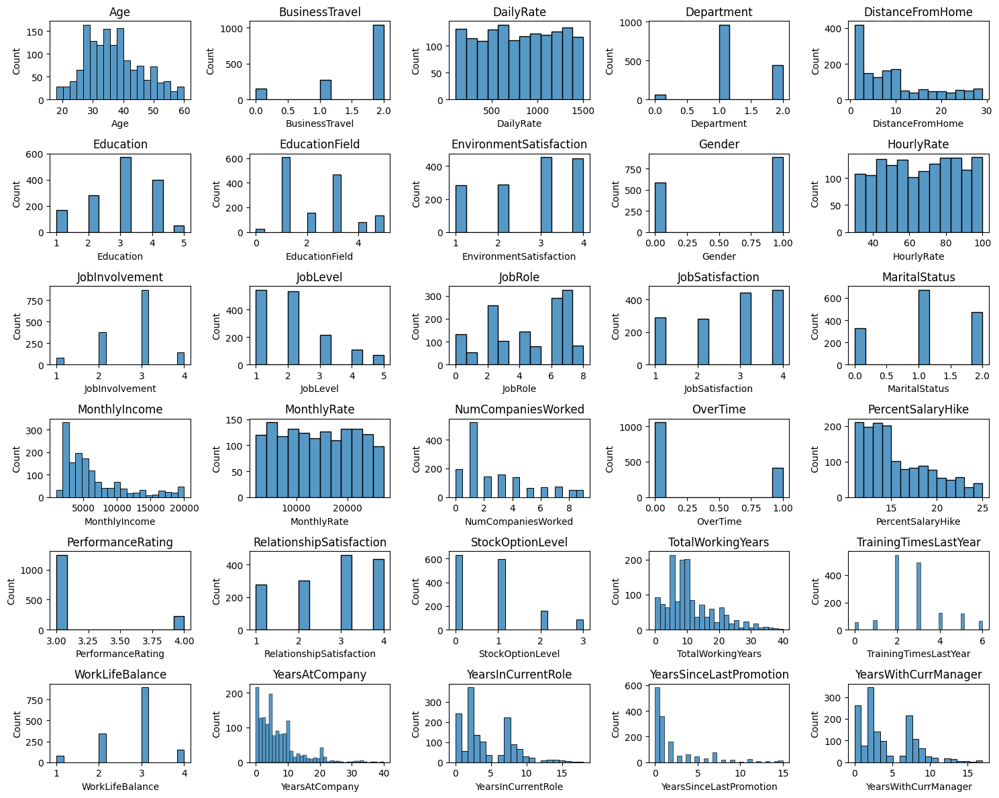

In [20]:
num_plots = len(numeric_columns)

# Calculate the number of rows and columns for the subplot grid
num_rows = min(6, (num_plots + 4) // 5)
num_cols = min(5, num_plots)

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 12))

# Plot histograms for each numeric feature
for i, column in enumerate(numeric_columns):
    row = i // num_cols
    col = i % num_cols
    sns.histplot(data=df, x=column, ax=axes[row, col])
    axes[row, col].set_title(column)

# Hide any empty subplots
for i in range(num_plots, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()


In [21]:
import holoviews as hv

# Create a layout for the plots
layout = hv.Layout()

# Plot histograms for each numeric feature
for column in numeric_columns:
    hist_plot = df.hvplot.hist(y=column, by='Attrition', subplots=False, width=300, height=300)
    layout += hist_plot

# Display the layout
layout.cols(5)


:Layout
   .NdOverlay.I      :NdOverlay   [Attrition]
      :Histogram   [Age]   (Age_count)
   .NdOverlay.II     :NdOverlay   [Attrition]
      :Histogram   [BusinessTravel]   (BusinessTravel_count)
   .NdOverlay.III    :NdOverlay   [Attrition]
      :Histogram   [DailyRate]   (DailyRate_count)
   .NdOverlay.IV     :NdOverlay   [Attrition]
      :Histogram   [Department]   (Department_count)
   .NdOverlay.V      :NdOverlay   [Attrition]
      :Histogram   [DistanceFromHome]   (DistanceFromHome_count)
   .NdOverlay.VI     :NdOverlay   [Attrition]
      :Histogram   [Education]   (Education_count)
   .NdOverlay.VII    :NdOverlay   [Attrition]
      :Histogram   [EducationField]   (EducationField_count)
   .NdOverlay.VIII   :NdOverlay   [Attrition]
      :Histogram   [EnvironmentSatisfaction]   (EnvironmentSatisfaction_count)
   .NdOverlay.IX     :NdOverlay   [Attrition]
      :Histogram   [Gender]   (Gender_count)
   .NdOverlay.X      :NdOverlay   [Attrition]
      :Histogram   [HourlyRate]   (HourlyRate_count)
   .NdOverlay.XI     :NdOverlay   [Attrition]
      :Histogram   [JobInvolvement]   (JobInvolvement_count)
   .NdOverlay.XII    :NdOverlay   [Attrition]
      :Histogram   [JobLevel]   (JobLevel_count)
   .NdOverlay.XIII   :NdOverlay   [Attrition]
      :Histogram   [JobRole]   (JobRole_count)
   .NdOverlay.XIV    :NdOverlay   [Attrition]
      :Histogram   [JobSatisfaction]   (JobSatisfaction_count)
   .NdOverlay.XV     :NdOverlay   [Attrition]
      :Histogram   [MaritalStatus]   (MaritalStatus_count)
   .NdOverlay.XVI    :NdOverlay   [Attrition]
      :Histogram   [MonthlyIncome]   (MonthlyIncome_count)
   .NdOverlay.XVII   :NdOverlay   [Attrition]
      :Histogram   [MonthlyRate]   (MonthlyRate_count)
   .NdOverlay.XVIII  :NdOverlay   [Attrition]
      :Histogram   [NumCompaniesWorked]   (NumCompaniesWorked_count)
   .NdOverlay.XIX    :NdOverlay   [Attrition]
      :Histogram   [OverTime]   (OverTime_count)
   .NdOverlay.XX     :NdOverlay   [Attrition]
      :Histogram   [PercentSalaryHike]   (PercentSalaryHike_count)
   .NdOverlay.XXI    :NdOverlay   [Attrition]
      :Histogram   [PerformanceRating]   (PerformanceRating_count)
   .NdOverlay.XXII   :NdOverlay   [Attrition]
      :Histogram   [RelationshipSatisfaction]   (RelationshipSatisfaction_count)
   .NdOverlay.XXIII  :NdOverlay   [Attrition]
      :Histogram   [StockOptionLevel]   (StockOptionLevel_count)
   .NdOverlay.XXIV   :NdOverlay   [Attrition]
      :Histogram   [TotalWorkingYears]   (TotalWorkingYears_count)
   .NdOverlay.XXV    :NdOverlay   [Attrition]
      :Histogram   [TrainingTimesLastYear]   (TrainingTimesLastYear_count)
   .NdOverlay.XXVI   :NdOverlay   [Attrition]
      :Histogram   [WorkLifeBalance]   (WorkLifeBalance_count)
   .NdOverlay.XXVII  :NdOverlay   [Attrition]
      :Histogram   [YearsAtCompany]   (YearsAtCompany_count)
   .NdOverlay.XXVIII :NdOverlay   [Attrition]
      :Histogram   [YearsInCurrentRole]   (YearsInCurrentRole_count)
   .NdOverlay.XXIX   :NdOverlay   [Attrition]
      :Histogram   [YearsSinceLastPromotion]   (YearsSinceLastPromotion_count)
   .NdOverlay.XXX    :NdOverlay   [Attrition]
      :Histogram   [YearsWithCurrManager]   (YearsWithCurrManager_count)

In [22]:
sns.pairplot(df)

***

## 📝 **Conclusions:**

***
- The workers with low `JobLevel`, `MonthlyIncome`, `YearAtCompany`, and `TotalWorkingYears` are more likely to quit there jobs.
- `BusinessTravel` : The workers who travel alot are more likely to quit then other employees.

- `Department` : The worker in `Research & Development` are more likely to stay then the workers on other departement.

- `EducationField` : The workers with `Human Resources` and `Technical Degree` are more likely to quit then employees from other fields of educations.

- `Gender` : The `Male` are more likely to quit.

- `JobRole` : The workers in `Laboratory Technician`, `Sales Representative`, and `Human Resources` are more likely to quit the workers in other positions.

- `MaritalStatus` : The workers who have `Single` marital status are more likely to quit the `Married`, and `Divorced`.

- `OverTime` : The workers who work more hours are likely to quit then others.

*** 

---
# 📉 Correlation Matrix

<Axes: >

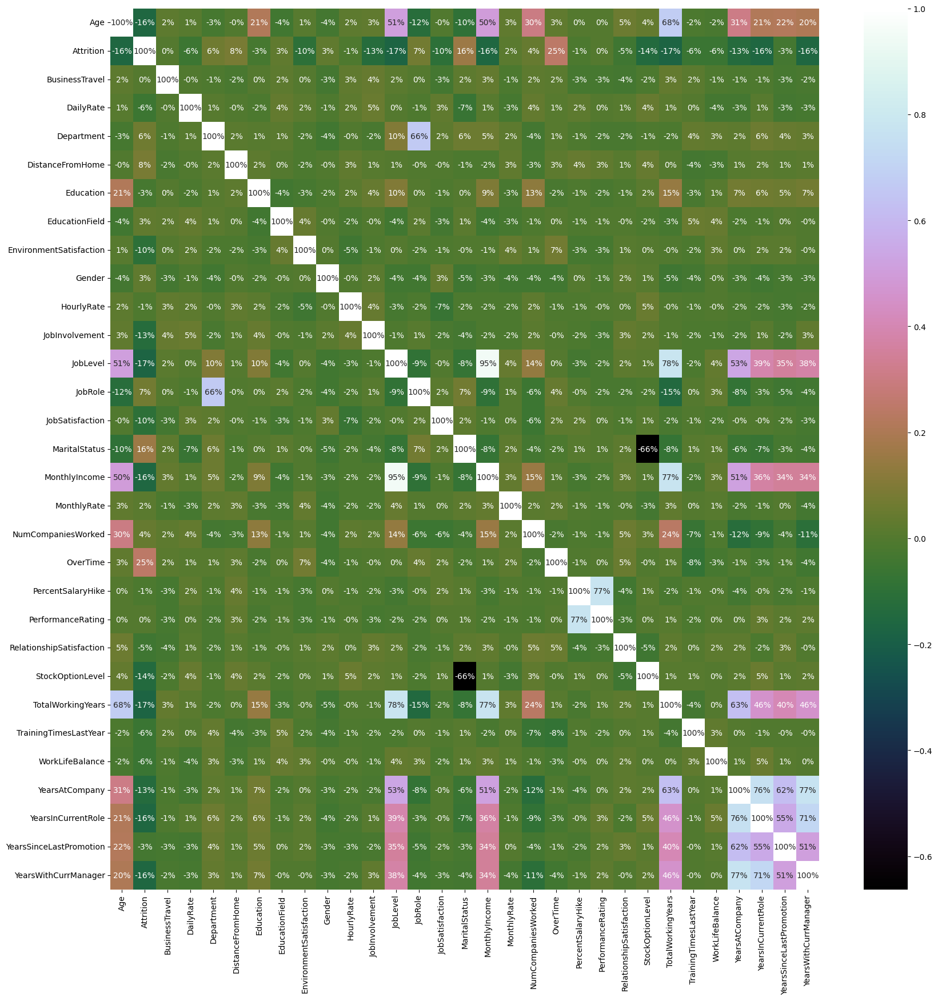

In [23]:
plt.figure(figsize=(20, 20))
sns.heatmap(df.corr(),annot=True,fmt='.0%',cmap="cubehelix")

## 📝 **Analysis of correlation results (sample analysis):**
- Monthly income is highly correlated with Job level.
- Job level is highly correlated with total working hours.
- Monthly income is highly correlated with total working hours.
- Age is also positively correlated with the Total working hours.
- Marital status and stock option level are negatively correlated
- etc

## Checking Outliers in the dataset

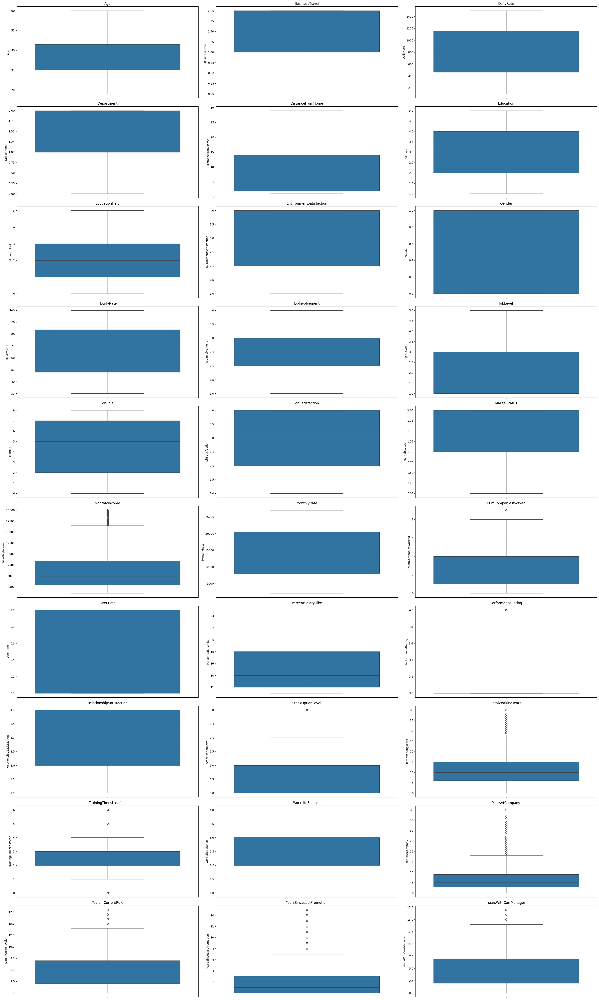

In [24]:
# Calculate the number of rows and columns for the subplot grid
num_rows = min(10, (num_plots + 2) // 3)
num_cols = min(3, num_plots)

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 50))

# Plot boxplots for each numeric feature
for i, column in enumerate(numeric_columns):
    row = i // num_cols
    col = i % num_cols
    sns.boxplot(data=df[column], ax=axes[row, col])
    axes[row, col].set_title(column)

# Hide any empty subplots
for i in range(num_plots, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

In [25]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

**'MonthlyIncome'**, **'TotalWorkingYears'**, **'YearsAtCompany'**,**YearsInCurrentRole** and **'YearsSinceLastPromotion'** has outliers, we need to remove outliers.

In [26]:
from scipy import stats

# Columns to remove outliers from
columns_to_remove_outliers = ['MonthlyIncome', 'TotalWorkingYears', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion']

# Loop through each column
for column in columns_to_remove_outliers:
    # Calculate z-scores
    z_scores = stats.zscore(df[column])
    # Define threshold
    threshold = 2
    # Identify outliers
    outliers = (z_scores > threshold) | (z_scores < -threshold)
    # Remove outliers from the dataset
    df = df[~outliers]


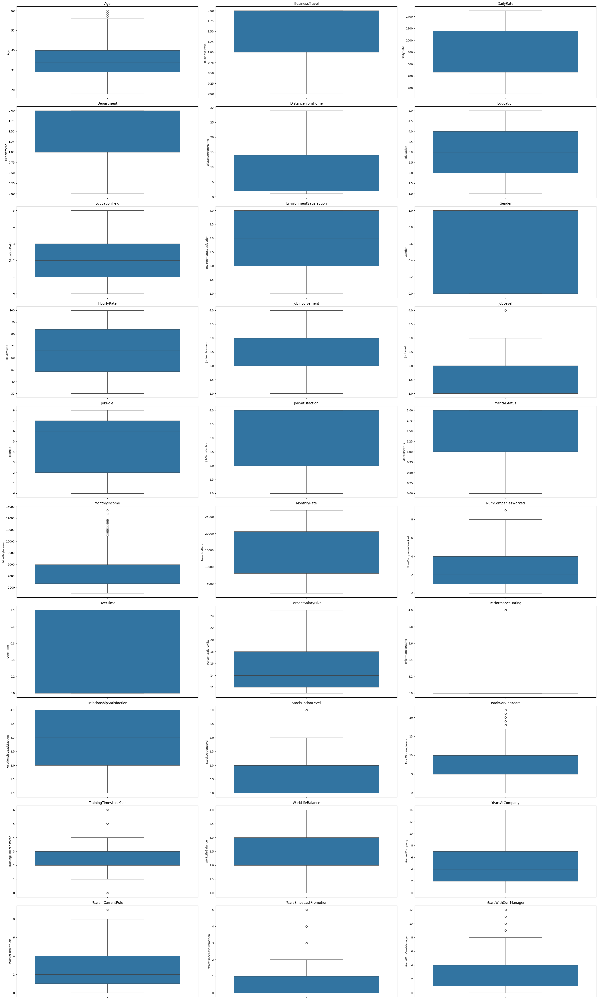

In [27]:
# Calculate the number of rows and columns for the subplot grid
num_rows = min(10, (num_plots + 2) // 3)
num_cols = min(3, num_plots)

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 50))

# Plot boxplots for each numeric feature
for i, column in enumerate(numeric_columns):
    row = i // num_cols
    col = i % num_cols
    sns.boxplot(data=df[column], ax=axes[row, col])
    axes[row, col].set_title(column)

# Hide any empty subplots
for i in range(num_plots, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

## Major outliers have been removed.

# <center> <p style="background-color:darkorange; font-family:calibri; font-size:120%; color:black; text-align:center; border-radius: 50px; padding:10px;width:80%">Splitting dataset into trainng set and testing set</p> </center>

In [28]:
X= df.drop(['Attrition'], axis=1)
y= df['Attrition']
print(X)
print(y)

      Age  BusinessTravel  DailyRate  Department  DistanceFromHome  Education  \
0      41               2       1102           2                 1          2   
1      49               1        279           1                 8          1   
2      37               2       1373           1                 2          2   
3      33               1       1392           1                 3          4   
4      27               2        591           1                 2          1   
...   ...             ...        ...         ...               ...        ...   
1465   36               1        884           1                23          2   
1466   39               2        613           1                 6          1   
1467   27               2        155           1                 4          3   
1468   49               1       1023           2                 2          3   
1469   34               2        628           1                 8          3   

      EducationField  Envir

# <center> <p style="background-color:darkorange; font-family:calibri; font-size:120%; color:black; text-align:center; border-radius: 50px; padding:10px;width:80%">Feature Selection</p> </center>

In [29]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

# Initialize SelectKBest with chi2 as scoring function
selector = SelectKBest(score_func=chi2)

# Fit selector to data
selector.fit(X, y)

# Get scores and p-values
scores = selector.scores_
p_values = selector.pvalues_

# Create DataFrame to visualize scores and p-values
results = pd.DataFrame({'Feature': X.columns, 'Score': scores, 'P-Value': p_values})

# Sort DataFrame by p-values
results = results.sort_values(by='Score')

# Print the results
print(results)

                     Feature         Score       P-Value
20         PerformanceRating      0.028829  8.651751e-01
1             BusinessTravel      0.034265  8.531434e-01
19         PercentSalaryHike      0.046368  8.295079e-01
8                     Gender      0.114919  7.346125e-01
5                  Education      0.285561  5.930796e-01
3                 Department      0.510310  4.750049e-01
6             EducationField      0.707354  4.003235e-01
25           WorkLifeBalance      0.741151  3.892923e-01
9                 HourlyRate      0.819695  3.652694e-01
24     TrainingTimesLastYear      1.582940  2.083377e-01
21  RelationshipSatisfaction      1.752527  1.855593e-01
12                   JobRole      2.338066  1.262462e-01
10            JobInvolvement      3.811379  5.090552e-02
17        NumCompaniesWorked      4.917166  2.659110e-02
28   YearsSinceLastPromotion      7.133759  7.564596e-03
7    EnvironmentSatisfaction      7.443916  6.365125e-03
11                  JobLevel   

## Choosing features with score greater than 1

In [30]:
selected_features = results[results['Score'] > 1 ]
print(selected_features)

                     Feature         Score       P-Value
24     TrainingTimesLastYear      1.582940  2.083377e-01
21  RelationshipSatisfaction      1.752527  1.855593e-01
12                   JobRole      2.338066  1.262462e-01
10            JobInvolvement      3.811379  5.090552e-02
17        NumCompaniesWorked      4.917166  2.659110e-02
28   YearsSinceLastPromotion      7.133759  7.564596e-03
7    EnvironmentSatisfaction      7.443916  6.365125e-03
11                  JobLevel      8.238660  4.100740e-03
13           JobSatisfaction      9.026564  2.660841e-03
14             MaritalStatus     12.927847  3.237300e-04
22          StockOptionLevel     19.006403  1.302805e-05
18                  OverTime     52.394812  4.539214e-13
0                        Age     56.717850  5.030485e-14
4           DistanceFromHome     73.017189  1.285256e-17
27        YearsInCurrentRole     91.653583  1.032588e-21
29      YearsWithCurrManager     98.857421  2.713513e-23
23         TotalWorkingYears   

## **Modifying training set X with selected features**

In [31]:
# Extract names of selected features
selected_feature = selected_features['Feature'].tolist()

# Modify features in X to include only selected features
X = X[selected_feature]

# Print the modified X
print(X)

      TrainingTimesLastYear  RelationshipSatisfaction  JobRole  \
0                         0                         1        7   
1                         3                         4        6   
2                         3                         2        2   
3                         3                         3        6   
4                         3                         4        2   
...                     ...                       ...      ...   
1465                      3                         3        2   
1466                      5                         1        0   
1467                      0                         2        4   
1468                      3                         4        7   
1469                      3                         1        2   

      JobInvolvement  NumCompaniesWorked  YearsSinceLastPromotion  \
0                  3                   8                        0   
1                  2                   1                        1   



# <center> <p style="background-color:darkorange; font-family:calibri; font-size:120%; color:black; text-align:center; border-radius: 50px; padding:10px;width:80%">Training and Testing different ML models</p> </center>




In [41]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y)

# **Applying machine learning algorithms**

In [63]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import confusion_matrix

In [43]:
# creating a list for storing accuracies of all models
accuracy_scores=[]
classifiers=['Logistic Regression','Decision Tree','Random Forest','K Nearesr Neighbors','Gaussian NB','Support Vector Machine','Linear Discriminant Analysis','Gradient Boosting','Extra Trees','Bagging','AdaBoost']

In [44]:
#Logistic Regression
lr = LogisticRegression()
lr.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = lr.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Logistic Regression--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)


# Decision tree
tree = DecisionTreeClassifier()
tree.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = tree.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Decision Tree Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)


# Random Forest
forest  = RandomForestClassifier()
forest.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = forest.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Random Forest Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)


# K-Nearest Neighbors
knn = KNeighborsClassifier()
knn.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = knn.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------K-Nearest Neighbors Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)


#Gausian Naive Bayes classifier
Gau = GaussianNB()
Gau.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = Gau.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Gausian Naive Bayes classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)


# Support Vector Machine
V = SVC()
V.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = V.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Support Vector Machine Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)


#LDA
lda = LinearDiscriminantAnalysis()
lda.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = lda.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Linear Discriminant Analysis Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)
  
  
#Gradient boost
grd = GradientBoostingClassifier()
grd.fit(X_train, y_train)
# Make predictions on the test set
Y_pred = grd.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Gradient Boosting Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)

  
# ExtraTreesClassifier
ext = ExtraTreesClassifier()
ext.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = ext.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Extra Trees Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)


# Bagging
bgg = BaggingClassifier()
bgg.fit(X_train,y_train) 
# Make predictions on the test set
Y_pred = bgg.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Bagging Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)


# adaboost
ada = AdaBoostClassifier()
ada.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = ada.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Ada Boost Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)

----------------------------------Logistic Regression--------------------------------------------
Accuracy: 0.8271028037383178
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.99      0.90       175
           1       0.67      0.10      0.18        39

    accuracy                           0.83       214
   macro avg       0.75      0.55      0.54       214
weighted avg       0.80      0.83      0.77       214

----------------------------------Decision Tree Classifier--------------------------------------------
Accuracy: 0.7850467289719626
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.84      0.86       175
           1       0.43      0.54      0.48        39

    accuracy                           0.79       214
   macro avg       0.66      0.69      0.67       214
weighted avg       0.81      0.79      0.79       214

----------------------------------Random 

In [45]:
print(classifiers)
print(accuracy_scores)

['Logistic Regression', 'Decision Tree', 'Random Forest', 'K Nearesr Neighbors', 'Gaussian NB', 'Support Vector Machine', 'Linear Discriminant Analysis', 'Gradient Boosting', 'Extra Trees', 'Bagging', 'AdaBoost']
[0.8271028037383178, 0.7850467289719626, 0.8457943925233645, 0.8177570093457944, 0.7757009345794392, 0.8177570093457944, 0.883177570093458, 0.8644859813084113, 0.8598130841121495, 0.8411214953271028, 0.8364485981308412]


In [46]:
classifier_accuracy_dict = dict(zip(classifiers, accuracy_scores))
sorted_classifier_accuracy_dict = dict(sorted(classifier_accuracy_dict.items(), key=lambda item: item[1], reverse=True))
print(sorted_classifier_accuracy_dict)

{'Linear Discriminant Analysis': 0.883177570093458, 'Gradient Boosting': 0.8644859813084113, 'Extra Trees': 0.8598130841121495, 'Random Forest': 0.8457943925233645, 'Bagging': 0.8411214953271028, 'AdaBoost': 0.8364485981308412, 'Logistic Regression': 0.8271028037383178, 'K Nearesr Neighbors': 0.8177570093457944, 'Support Vector Machine': 0.8177570093457944, 'Decision Tree': 0.7850467289719626, 'Gaussian NB': 0.7757009345794392}


# Comparing Models Performance 📊

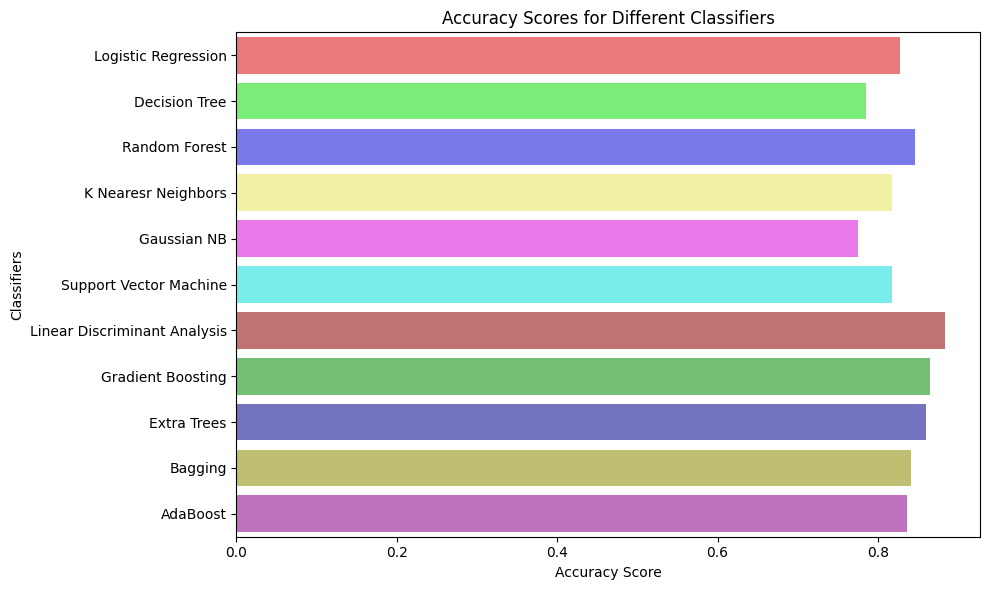

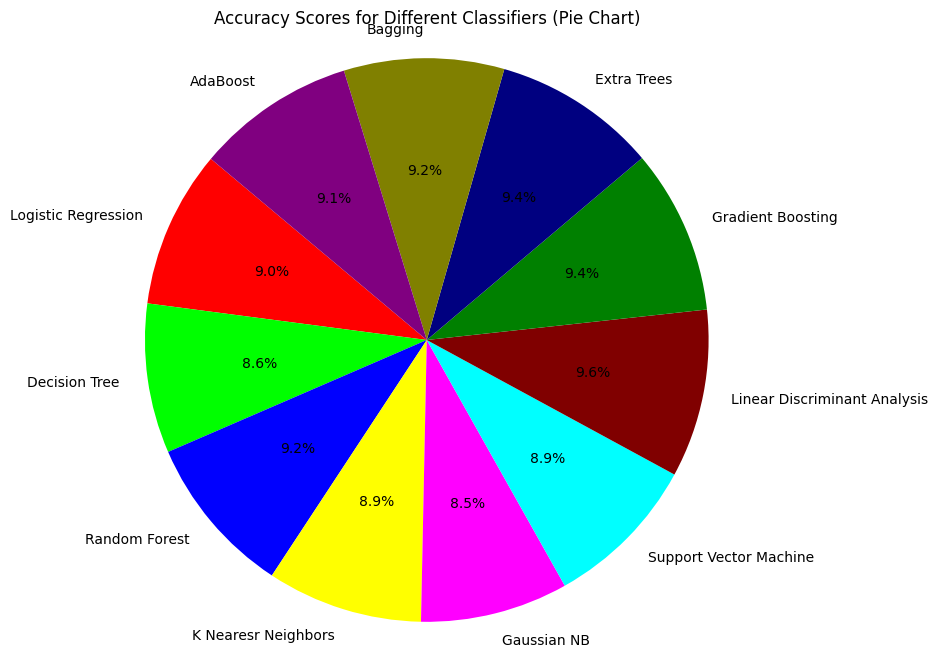

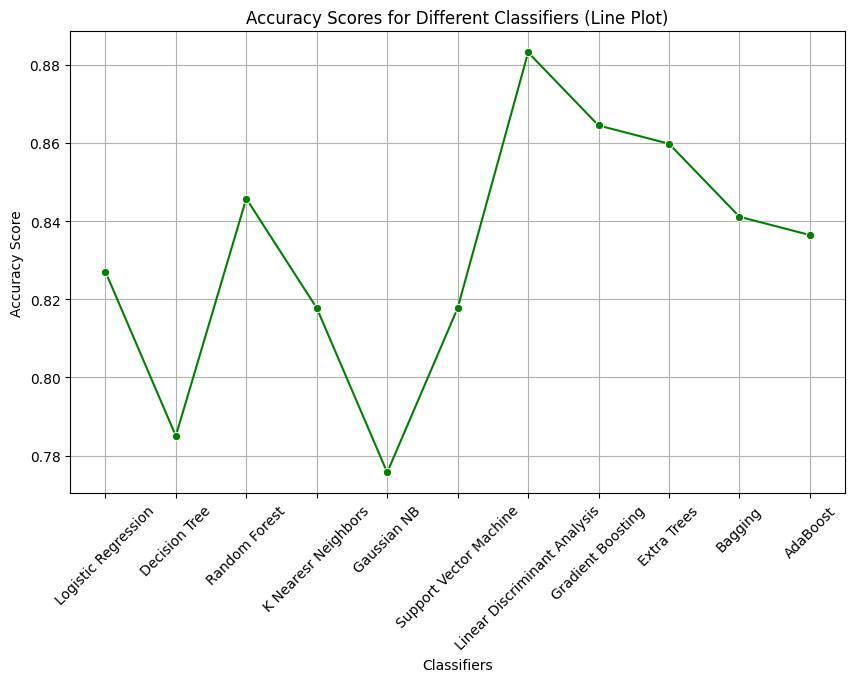

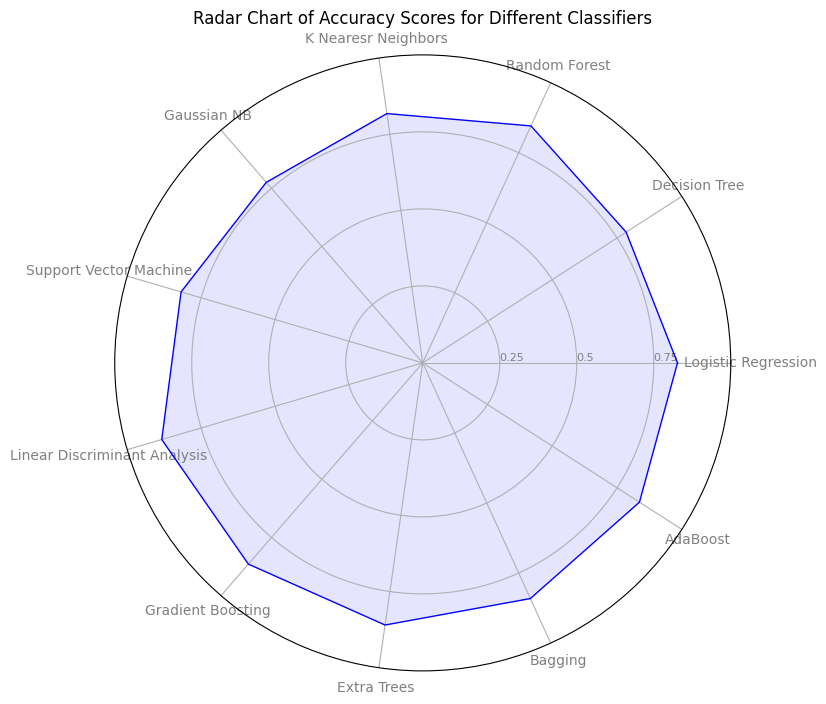

In [47]:
colors = ['#FF6666', '#66FF66', '#6666FF', '#FFFF99', '#FF66FF', '#66FFFF', '#CC6666', '#66CC66', '#6666CC', '#CCCC66', '#CC66CC']

# Horizontal Bar Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=accuracy_scores, y=classifiers,palette=colors)
plt.xlabel('Accuracy Score')
plt.ylabel('Classifiers')
plt.title('Accuracy Scores for Different Classifiers')
plt.tight_layout()
plt.show()

# Pie Chart
plt.figure(figsize=(8, 8))
colors = ['#FF0000', '#00FF00', '#0000FF', '#FFFF00', '#FF00FF', '#00FFFF', '#800000', '#008000', '#000080', '#808000', '#800080']
plt.pie(accuracy_scores, labels=classifiers, colors=colors, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that the pie is drawn as a circle.
plt.title('Accuracy Scores for Different Classifiers (Pie Chart)')
plt.show()

# Line Plot
plt.figure(figsize=(10, 6))
sns.lineplot(x=classifiers, y=accuracy_scores, marker='o', color='green')
plt.xlabel('Classifiers')
plt.ylabel('Accuracy Score')
plt.title('Accuracy Scores for Different Classifiers (Line Plot)')
plt.xticks(rotation=45)
plt.grid()
plt.show()

# Radar Chart
categories = classifiers
N = len(categories)
values = accuracy_scores
angles = [n / float(N) * 2 * np.pi for n in range(N)]
values += values[:1]
angles += angles[:1]

plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)
plt.xticks(angles[:-1], categories, color='grey', size=10)
ax.set_rlabel_position(0)
plt.yticks([0.25, 0.5, 0.75], ["0.25", "0.5", "0.75"], color="grey", size=8)
plt.ylim(0, 1)
ax.plot(angles, values, linewidth=1, linestyle='solid', color='blue')
ax.fill(angles, values, 'b', alpha=0.1)

plt.title('Radar Chart of Accuracy Scores for Different Classifiers')
plt.show()

# **Hyperparameter Tuning**


In [54]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform


# Define classifiers
classifiers = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'K Nearest Neighbors': KNeighborsClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'Extra Trees': ExtraTreesClassifier(),
    'Bagging': BaggingClassifier(),
    'AdaBoost': AdaBoostClassifier(),
}

# Define parameter distributions for each classifier
param_dists = {
    'Logistic Regression': {
        'C': uniform(loc=0.1, scale=10),  # Penalty parameter C
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear', 'saga'],
        'class_weight': [None, 'balanced']
    },
    'Decision Tree': {
        'criterion': ['gini', 'entropy'],
        'max_depth': [None, 10, 20, 30, 40, 50],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    },
    'Random Forest': {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': ['auto', 'sqrt', 'log2']
    },
    'K Nearest Neighbors': {
        'n_neighbors': [3, 5, 7, 9],
        'weights': ['uniform', 'distance'],
        'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
    },
    'Gradient Boosting': {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.01, 0.1, 1],
        'max_depth': [3, 4, 5],
        'min_samples_split': [2, 3, 4],
        'min_samples_leaf': [1, 2, 3]
    },
    'Extra Trees': {
        'n_estimators': [50, 100, 150],
        'max_features': ['auto', 'sqrt', 'log2'],
        'max_depth': [None, 10, 20, 30, 40, 50],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    },
    'Bagging': {
        'n_estimators': [10, 50, 100],
        'max_samples': [0.5, 1.0],
        'max_features': [0.5, 1.0],
        'bootstrap': [True, False],
        'bootstrap_features': [True, False]
    },
    'AdaBoost': {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.01, 0.1, 1],
        'algorithm': ['SAMME', 'SAMME.R']
    },
}

# Perform RandomizedSearchCV for each classifier
for clf_name, classifier in classifiers.items():
    param_dist = param_dists[clf_name]
    random_search = RandomizedSearchCV(estimator=classifier, param_distributions=param_dist, n_iter=20, cv=5, scoring='accuracy', random_state=42)
    random_search.fit(X_train, y_train)
    
    best_params = random_search.best_params_
    best_score = random_search.best_score_
    
    print(f"Best Parameters for {clf_name}: {best_params}")
    print(f"Best Score for {clf_name}: {best_score}")


Best Parameters for Logistic Regression: {'C': 9.932308858067882, 'class_weight': None, 'penalty': 'l1', 'solver': 'liblinear'}
Best Score for Logistic Regression: 0.8593051255589955
Best Parameters for Decision Tree: {'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 10, 'criterion': 'gini'}
Best Score for Decision Tree: 0.7878087375300997
Best Parameters for Random Forest: {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': 20}
Best Score for Random Forest: 0.8429308565531477
Best Parameters for K Nearest Neighbors: {'weights': 'distance', 'n_neighbors': 9, 'algorithm': 'ball_tree'}
Best Score for K Nearest Neighbors: 0.8159477124183006
Best Parameters for Gradient Boosting: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 3, 'learning_rate': 0.1}
Best Score for Gradient Boosting: 0.8487650498796009
Best Parameters for Extra Trees: {'n_estimators': 100, 'min_samples_split': 5, 'min_samp

## After finding optimal parameters for each models, we will be training those model with same dataset

In [55]:
# creating a list for storing accuracies of all models
accuracy_scores=[]
classifiers=['Logistic Regression','Decision Tree','Random Forest','K Nearesr Neighbors','Gaussian NB','Support Vector Machine','Linear Discriminant Analysis','Gradient Boosting','Extra Trees','Bagging','AdaBoost']

In [65]:
def check_Confusion_Matrix(y_test, Y_pred):
    # Calculate confusion matrix
    cm = confusion_matrix(y_test, Y_pred)
    # Visualize confusion matrix using seaborn
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()

----------------------------------Logistic Regression--------------------------------------------
Accuracy: 0.883177570093458
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.98      0.93       175
           1       0.82      0.46      0.59        39

    accuracy                           0.88       214
   macro avg       0.85      0.72      0.76       214
weighted avg       0.88      0.88      0.87       214



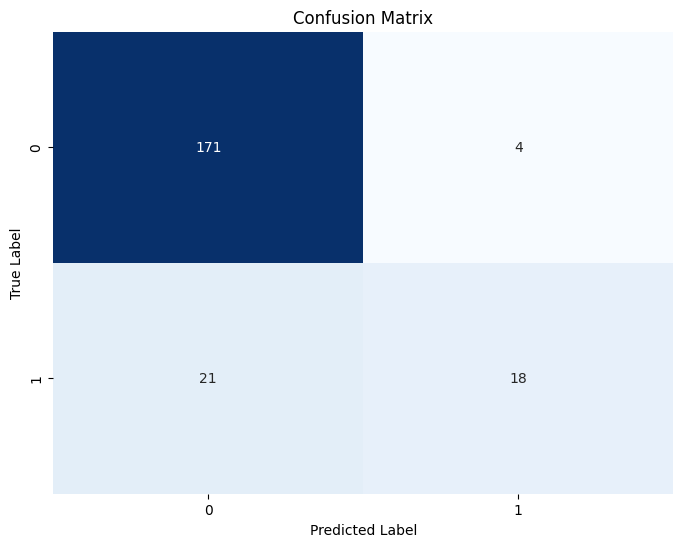

----------------------------------Decision Tree Classifier--------------------------------------------
Accuracy: 0.7757009345794392
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.84      0.86       175
           1       0.40      0.49      0.44        39

    accuracy                           0.78       214
   macro avg       0.64      0.66      0.65       214
weighted avg       0.79      0.78      0.78       214



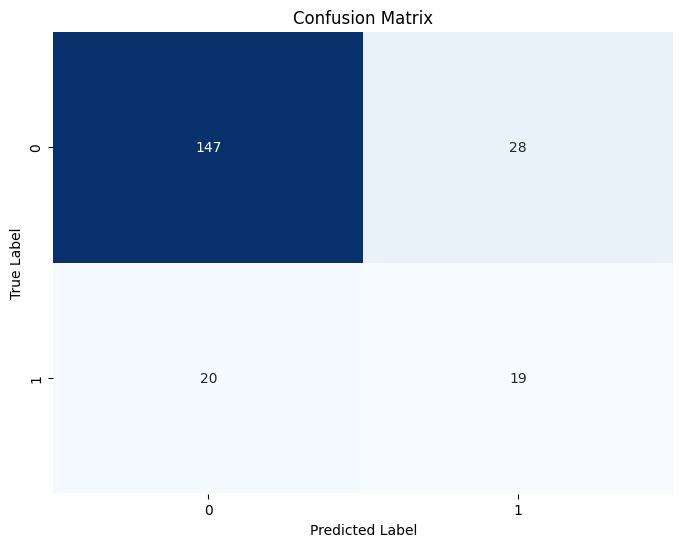

----------------------------------Random Forest Classifier--------------------------------------------
Accuracy: 0.8504672897196262
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.98      0.91       175
           1       0.77      0.26      0.38        39

    accuracy                           0.85       214
   macro avg       0.81      0.62      0.65       214
weighted avg       0.84      0.85      0.82       214



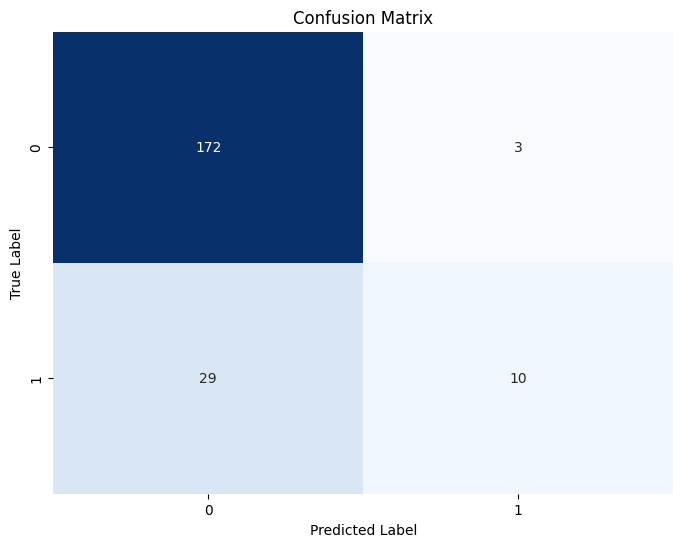

----------------------------------K-Nearest Neighbors Classifier--------------------------------------------
Accuracy: 0.8177570093457944
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.98      0.90       175
           1       0.50      0.08      0.13        39

    accuracy                           0.82       214
   macro avg       0.66      0.53      0.52       214
weighted avg       0.77      0.82      0.76       214



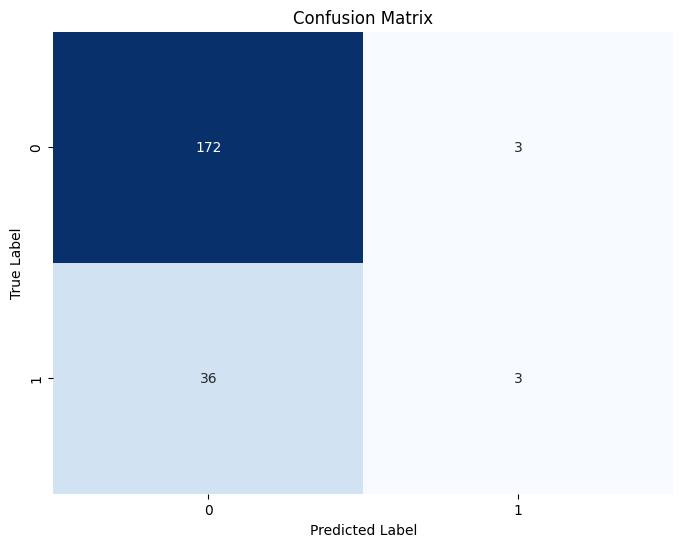

----------------------------------Gausian Naive Bayes classifier--------------------------------------------
Accuracy: 0.7757009345794392
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.83      0.86       175
           1       0.41      0.51      0.45        39

    accuracy                           0.78       214
   macro avg       0.65      0.67      0.66       214
weighted avg       0.80      0.78      0.79       214



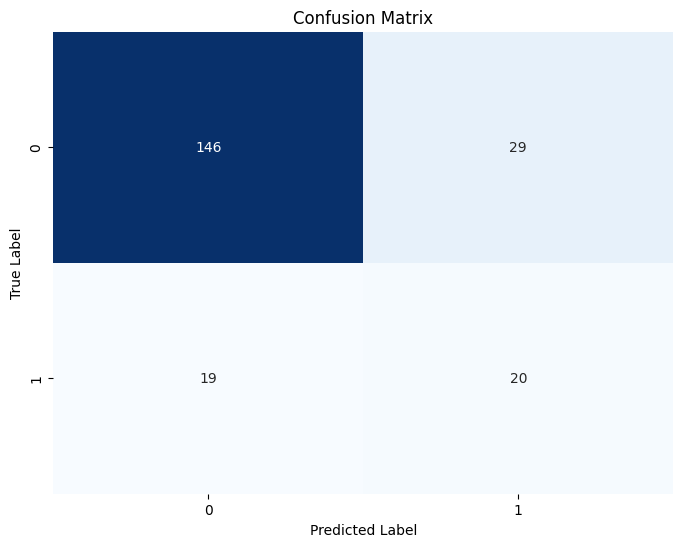

----------------------------------Support Vector Machine Classifier--------------------------------------------
Accuracy: 0.8177570093457944
Classification Report:
              precision    recall  f1-score   support

           0       0.82      1.00      0.90       175
           1       0.00      0.00      0.00        39

    accuracy                           0.82       214
   macro avg       0.41      0.50      0.45       214
weighted avg       0.67      0.82      0.74       214



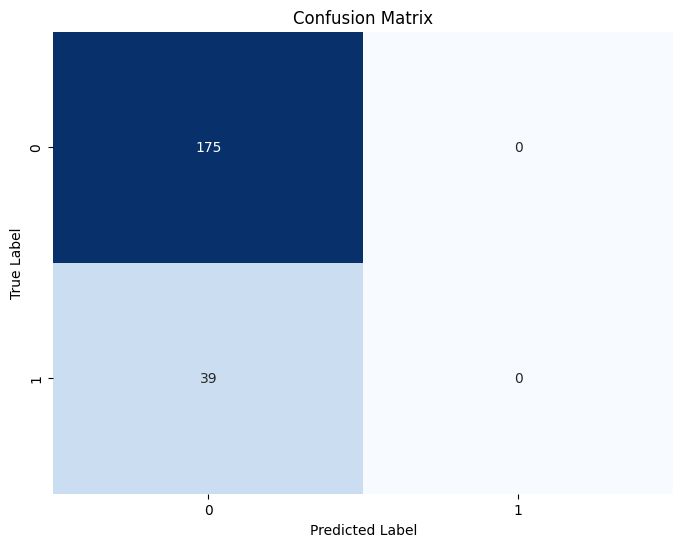

----------------------------------Linear Discriminant Analysis Classifier--------------------------------------------
Accuracy: 0.883177570093458
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.98      0.93       175
           1       0.85      0.44      0.58        39

    accuracy                           0.88       214
   macro avg       0.87      0.71      0.75       214
weighted avg       0.88      0.88      0.87       214



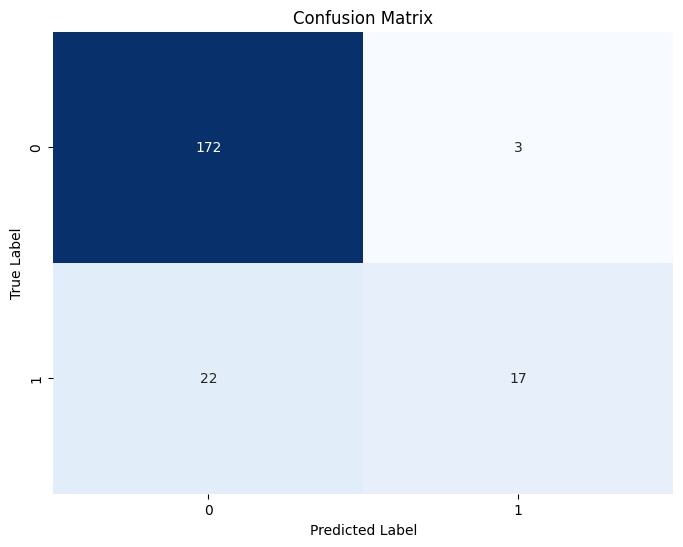

----------------------------------Gradient Boosting Classifier--------------------------------------------
Accuracy: 0.8644859813084113
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.97      0.92       175
           1       0.73      0.41      0.52        39

    accuracy                           0.86       214
   macro avg       0.80      0.69      0.72       214
weighted avg       0.85      0.86      0.85       214



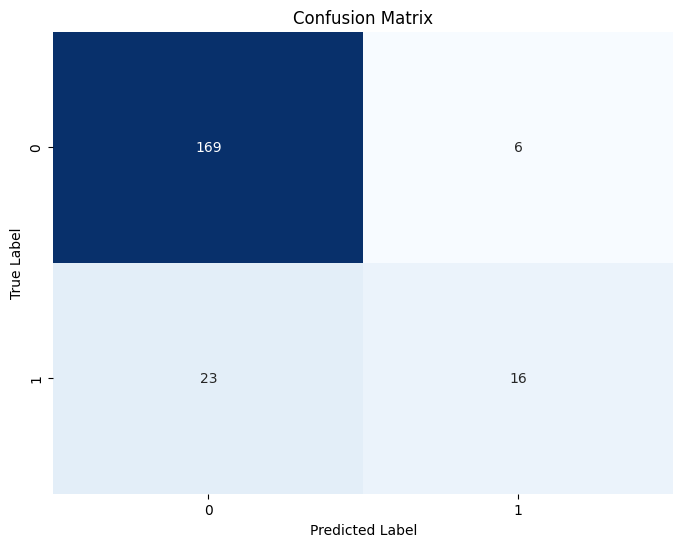

----------------------------------Extra Trees Classifier--------------------------------------------
Accuracy: 0.8504672897196262
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.99      0.92       175
           1       0.82      0.23      0.36        39

    accuracy                           0.85       214
   macro avg       0.84      0.61      0.64       214
weighted avg       0.85      0.85      0.81       214



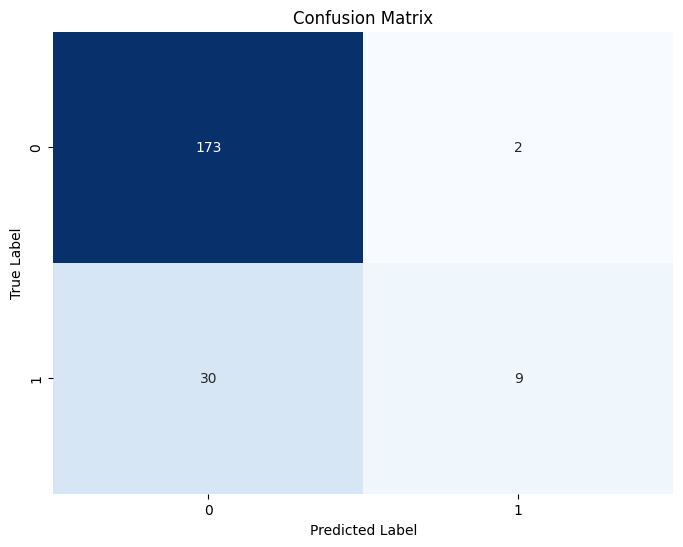

----------------------------------Bagging Classifier--------------------------------------------
Accuracy: 0.8457943925233645
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.98      0.91       175
           1       0.75      0.23      0.35        39

    accuracy                           0.85       214
   macro avg       0.80      0.61      0.63       214
weighted avg       0.83      0.85      0.81       214



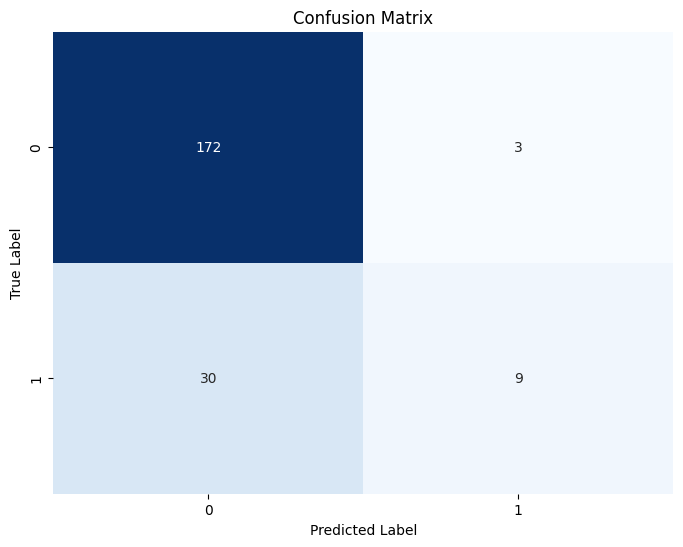

----------------------------------Ada Boost Classifier--------------------------------------------
Accuracy: 0.822429906542056
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.94      0.90       175
           1       0.52      0.28      0.37        39

    accuracy                           0.82       214
   macro avg       0.69      0.61      0.63       214
weighted avg       0.79      0.82      0.80       214



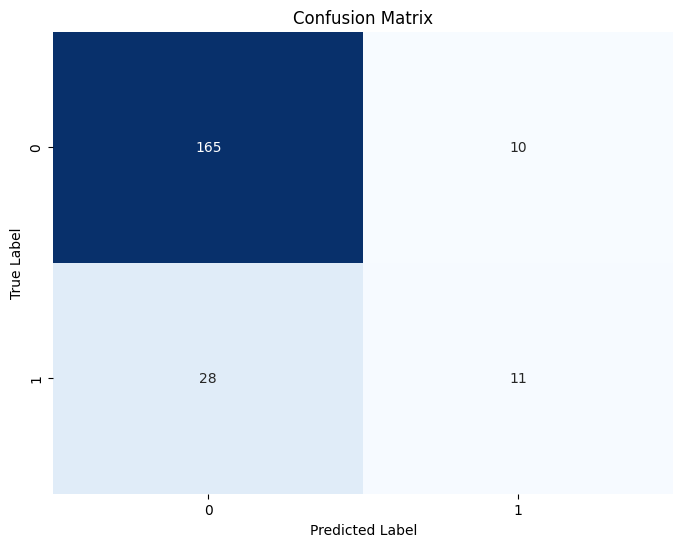

In [66]:
#Logistic Regression
lr = LogisticRegression(C= 9.932308858067882, class_weight= None, penalty= 'l1', solver= 'liblinear')
lr.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = lr.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Logistic Regression--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)
check_Confusion_Matrix(y_test, Y_pred)


# Decision tree
tree = DecisionTreeClassifier(min_samples_split= 10, min_samples_leaf= 1, max_depth= 10, criterion= 'gini')
tree.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = tree.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Decision Tree Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)
check_Confusion_Matrix(y_test, Y_pred)

# Random Forest
forest  = RandomForestClassifier(n_estimators= 200, min_samples_split= 10, min_samples_leaf= 2, max_features= 'log2', max_depth= 20)
forest.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = forest.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Random Forest Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)
check_Confusion_Matrix(y_test, Y_pred)

# K-Nearest Neighbors
knn = KNeighborsClassifier(algorithm= 'ball_tree', n_neighbors= 9, weights= 'distance')
knn.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = knn.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------K-Nearest Neighbors Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)
check_Confusion_Matrix(y_test, Y_pred)

#Gausian Naive Bayes classifier
Gau = GaussianNB()
Gau.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = Gau.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Gausian Naive Bayes classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)
check_Confusion_Matrix(y_test, Y_pred)

# Support Vector Machine
V = SVC(kernel='rbf', C=1.0, gamma=0.1)
V.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = V.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Support Vector Machine Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)
check_Confusion_Matrix(y_test, Y_pred)

#LDA
lda = LinearDiscriminantAnalysis()
lda.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = lda.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Linear Discriminant Analysis Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)
check_Confusion_Matrix(y_test, Y_pred)  
  
#Gradient boost
grd = GradientBoostingClassifier(n_estimators= 100, min_samples_split= 2, min_samples_leaf= 1, max_depth= 3, learning_rate= 0.1)
grd.fit(X_train, y_train)
# Make predictions on the test set
Y_pred = grd.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Gradient Boosting Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)
check_Confusion_Matrix(y_test, Y_pred)
  
# ExtraTreesClassifier
ext = ExtraTreesClassifier(n_estimators= 100, min_samples_split= 5, min_samples_leaf= 2, max_features= 'log2', max_depth= 20)
ext.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = ext.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Extra Trees Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)
check_Confusion_Matrix(y_test, Y_pred)

# Bagging
bgg = BaggingClassifier(n_estimators= 100, max_samples= 1.0, max_features= 0.5, bootstrap_features= False, bootstrap= True)
bgg.fit(X_train,y_train) 
# Make predictions on the test set
Y_pred = bgg.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Bagging Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)
check_Confusion_Matrix(y_test, Y_pred)

# adaboost
ada = AdaBoostClassifier(n_estimators= 150, learning_rate= 1, algorithm= 'SAMME')
ada.fit(X_train,y_train)
# Make predictions on the test set
Y_pred = ada.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(y_test, Y_pred)
accuracy_scores.append(float(accuracy))
classification_rep = classification_report(y_test, Y_pred)
print("----------------------------------Ada Boost Classifier--------------------------------------------")
print(f'Accuracy: {accuracy}')
print(f'Classification Report:')
print(classification_rep)
check_Confusion_Matrix(y_test, Y_pred)

In [58]:
classifier_accuracy_dict = dict(zip(classifiers, accuracy_scores))
sorted_classifier_accuracy_dict = dict(sorted(classifier_accuracy_dict.items(), key=lambda item: item[1], reverse=True))
print(sorted_classifier_accuracy_dict)

{'Logistic Regression': 0.883177570093458, 'Support Vector Machine': 0.883177570093458, 'Random Forest': 0.8411214953271028, 'Gradient Boosting': 0.8411214953271028, 'K Nearesr Neighbors': 0.8177570093457944, 'Extra Trees': 0.8177570093457944, 'AdaBoost': 0.8177570093457944, 'Decision Tree': 0.780373831775701, 'Gaussian NB': 0.7757009345794392, 'Linear Discriminant Analysis': 0.7757009345794392, 'Bagging': 0.7757009345794392}


# Comparing Models Performance 📊 again

In [62]:
# Convert the dictionary to a DataFrame
df = pd.DataFrame(sorted_classifier_accuracy_dict.items(), columns=['Model', 'Accuracy'])
# Sort the DataFrame by accuracy
df_sorted = df.sort_values(by='Accuracy', ascending=False)
# Plot the accuracy scores
plot = df_sorted.hvplot.barh(x='Model', y='Accuracy', title='Model Accuracy Comparison', xlabel='Model', ylabel='Accuracy')
plot


:Bars   [Model]   (Accuracy)

## So, Logistic regression is giving the best accuracy(88%) over other ml models.